# San Jose Real Estate Market Analysis
#### Nicholas Cuneo

In this analysis I will use housing market data of San Jose, CA, pulled from [Redfin](https://www.redfin.com/city/17420/CA/San-Jose).  This will consist of 2 years of real estate sales from May 2019 through April 2021, and will show how the market responded to the Covid-19 pandemic.  

For this analysis, we are working for a real estate investment firm, CG Realty.  We are tasked with analyzing market to identify viable investment properties. Their focus is on short term investment properties that they can buy and sell for profit. We will look at multiple property variables such as number of bedrooms, bathrooms, square footage, property type, location etc., and determine which variables have a high affect on a property's value.  

The goal is to identify which properties are undervalued, ie. are selling for prices below their true value, so that CG Realty can invest in these properties for a quick ROI. We will use our analysis to create a multiple linear regression model from the data that we will use to determine a home's true value. We will then be able to enter in the variables of a new listing into the model, which will then return the predicted value for the property, and therefore determine whether it is a viable investment or not.  

For our purposes we make the assumption that our model is perfect.  Known limitations to be aware of are that our model will not take into account certain factors such as the condition of a property (whether it's renvovated or outdated) or socioeconomic factors of a property's location.

## Import Packages and Data Cleansing

In [1]:
#import packages
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns

#import data into pandas
from pathlib import Path
root = Path('data')
csv_path1 =(root / 'sanjose_north.csv')
csv_path2 =(root / 'sanjose_south.csv')

df1 = pd.read_csv(csv_path1)
df2 = pd.read_csv(csv_path2)
dfraw = df1.append(df2, ignore_index = True)

#save uncleaned dataset to csv
dfraw.to_csv(root / 'uncleaned.csv')

print(dfraw.shape)
dfraw.head(5)

(18283, 27)


,SALE TYPE,SOLD DATE,PROPERTY TYPE,ADDRESS,CITY,STATE OR PROVINCE,ZIP OR POSTAL CODE,PRICE,BEDS,BATHS,...,STATUS,NEXT OPEN HOUSE START TIME,NEXT OPEN HOUSE END TIME,URL (SEE http://www.redfin.com/buy-a-home/comparative-market-analysis FOR INFO ON PRICING),SOURCE,MLS#,FAVORITE,INTERESTED,LATITUDE,LONGITUDE
0,PAST SALE,May-24-2019,Single Family Residential,902 Mccreery Ave,SAN JOSE,CA,95116,808000.0,4.0,2.0,...,Sold,NaN,NaN,http://www.redfin.com/CA/San-Jose/902-McCreery...,MLSListings,ML81747523,N,Y,37.344478,-121.842584
1,PAST SALE,March-23-2020,Condo/Co-op,906 La Barbera Dr,SAN JOSE,CA,95126,623000.0,1.0,1.0,...,Sold,NaN,NaN,http://www.redfin.com/CA/San-Jose/906-La-Barbe...,MLSListings,ML81783575,N,Y,37.308910,-121.918937
2,PAST SALE,March-11-2021,Condo/Co-op,318 Morning Star Dr,San Jose,CA,95131,820000.0,2.0,2.0,...,Sold,NaN,NaN,http://www.redfin.com/CA/San-Jose/318-Morning-...,"bridgeMLS, Bay East AOR, or Contra Costa AOR",40935027,N,Y,37.386910,-121.887934
3,PAST SALE,July-12-2019,Condo/Co-op,1055 N Capitol Ave #75,SAN JOSE,CA,95133,527500.0,2.0,2.0,...,Sold,NaN,NaN,http://www.redfin.com/CA/San-Jose/1055-N-Capit...,MLSListings,ML81756552,N,Y,37.383578,-121.859213
4,PAST SALE,October-30-2019,Single Family Residential,2986 Stanhope Dr,SAN JOSE,CA,95121,875000.0,5.0,3.0,...,Sold,NaN,NaN,http://www.redfin.com/CA/San-Jose/2986-Stanhop...,MLSListings,ML81766592,N,Y,37.307749,-121.817538


In [2]:
#use describe to get summary statistics
dfraw.describe()

,PRICE,BEDS,BATHS,SQUARE FEET,LOT SIZE,YEAR BUILT,DAYS ON MARKET,$/SQUARE FEET,HOA/MONTH,NEXT OPEN HOUSE START TIME,NEXT OPEN HOUSE END TIME,LATITUDE,LONGITUDE
count,1.828100e+04,17956.000000,17686.000000,18125.000000,1.582500e+04,18156.000000,16451.000000,1.808900e+04,5807.000000,0.0,0.0,18281.000000,18281.000000
mean,1.182851e+06,3.207452,2.247866,1741.439448,4.093738e+04,1973.915785,348.047049,7.506331e+02,353.704150,NaN,NaN,37.301450,-121.874615
std,2.608136e+06,1.108642,0.768187,3913.789106,2.163255e+06,22.626465,223.069315,8.177333e+03,194.126443,NaN,NaN,0.048540,0.061875
min,1.000000e+04,0.000000,0.500000,1.000000,1.000000e+00,1880.000000,1.000000,1.000000e+01,1.000000,NaN,NaN,37.152245,-122.035999
25%,7.800000e+05,3.000000,2.000000,1216.000000,4.091000e+03,1960.000000,157.000000,5.530000e+02,242.500000,NaN,NaN,37.265362,-121.915199
50%,1.050000e+06,3.000000,2.000000,1519.000000,6.098000e+03,1972.000000,312.000000,6.640000e+02,343.000000,NaN,NaN,37.299914,-121.875140
75%,1.400000e+06,4.000000,2.500000,1953.000000,7.431000e+03,1988.000000,554.000000,8.060000e+02,440.000000,NaN,NaN,37.330073,-121.830351
max,2.555000e+08,32.000000,16.000000,350451.000000,2.509927e+08,2021.000000,730.000000,1.100000e+06,1450.000000,NaN,NaN,37.434038,-121.634912


- Quick insights into the summary statistics show that average home in San Jose is a 3 Bed, 2 Bath home of 1700 square feet and has a median price of $1,182,851.
- Homes being sold in San Jose are on the older side, with the mean year built of 1973.
- Right off the bat we can identify inaccurate data within the Days on Market field.  Properties in San Jose are not on the market for too long, so seeing as how the mean and median values for this field are 348 and 312 respectively tells us this data is not accurate.

In [3]:
#drop rows based on MLS# listing to get rid of duplicates
dfraw.drop_duplicates(subset=['MLS#'], inplace=True)
dfraw.shape

(15117, 27)

In [4]:
#get unique values for property types
unique_type = dfraw['PROPERTY TYPE'].unique()

print("Unique property types:")
print(unique_type)

Unique property types:
['Single Family Residential' 'Condo/Co-op' 'Townhouse'
 'Multi-Family (2-4 Unit)' 'Multi-Family (5+ Unit)'
 'Mobile/Manufactured Home' 'Other' 'Vacant Land']


In [5]:
#create function to filter out non-residential property types 
#check to make sure rows filtered out

def filter_rows_by_values(df, col, values):
    return df[df[col].isin(values) == False]

dfraw = filter_rows_by_values(dfraw,"PROPERTY TYPE", ['Other','Vacant Land','Unknown'])

#check to make sure rows filtered out
print("Rows remaining:", len(dfraw))
print(dfraw['PROPERTY TYPE'].value_counts())

Rows remaining: 15055
Single Family Residential    9656
Condo/Co-op                  2739
Townhouse                    1672
Mobile/Manufactured Home      630
Multi-Family (2-4 Unit)       324
Multi-Family (5+ Unit)         34
Name: PROPERTY TYPE, dtype: int64


In [6]:
#drop unneccessary columns and rename remaining columns for easier reading

df = dfraw.drop(columns = ['SALE TYPE', 'ADDRESS', 'NEXT OPEN HOUSE START TIME', 'DAYS ON MARKET','STATUS', 
                           'URL (SEE http://www.redfin.com/buy-a-home/comparative-market-analysis FOR INFO ON PRICING)', 
                           'SOURCE', 'MLS#', 'NEXT OPEN HOUSE END TIME','FAVORITE', 'INTERESTED','CITY','STATE OR PROVINCE',
                           'LOCATION'])

df.rename(index=str, columns={
    "SOLD DATE":"Sold Date","PROPERTY TYPE":"Property Type","ZIP OR POSTAL CODE":"Zipcode",
    "PRICE":"Price","BEDS":"Beds","BATHS":"Baths","SQUARE FEET":"SQFT","LOT SIZE":"Lot Size",
    "YEAR BUILT":"Year Built","$/SQUARE FEET":"Price per SQFT","HOA/MONTH":"HOA",
    "LATITUDE":"Latitude","LONGITUDE":"Longitude"}, inplace=True)

df.columns

Index(['Sold Date', 'Property Type', 'Zipcode', 'Price', 'Beds', 'Baths',
       'SQFT', 'Lot Size', 'Year Built', 'Price per SQFT', 'HOA', 'Latitude',
       'Longitude'],
      dtype='object')

In [7]:
#check column data types
df.dtypes

Sold Date          object
Property Type      object
Zipcode            object
Price             float64
Beds              float64
Baths             float64
SQFT              float64
Lot Size          float64
Year Built        float64
Price per SQFT    float64
HOA               float64
Latitude          float64
Longitude         float64
dtype: object

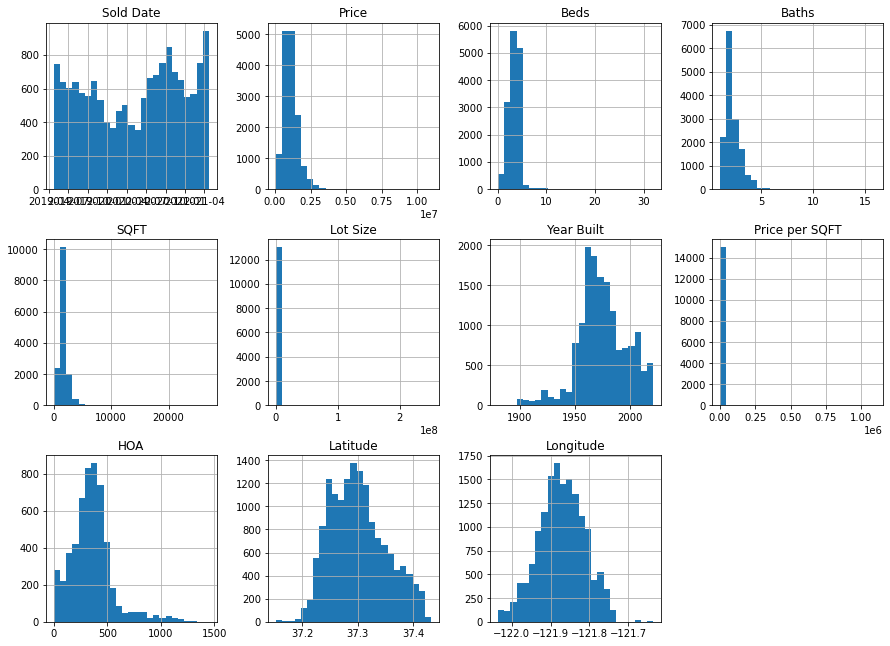

In [8]:
#convert Sold Date to datetime and clean zipcode so that only first 5 numbers show
df['Sold Date'] = pd.to_datetime(df['Sold Date'])
df['Zipcode'] = df['Zipcode'].astype(str)
df['Zipcode'] = df['Zipcode'].str[:5]

#before removing nulls, explore the distributions of numerical columns
ax_list = df.hist(bins=25, layout=(4,4), figsize=(15,15))

With nulls still included we can see that they might be pulling some of the distributions towards zero.

Rows that contain null values in critical columns such as **Beds, Baths, and Price** will be dropped.  Null values in columns that are not as critical will be filled with averages or zero

In [9]:
# drop rows with null values in critical columns
df = df.dropna(axis=0, how='any', subset=['Beds','Baths', 'Price'])
print(df.shape)
print(df.isnull().sum())

(14760, 13)
Sold Date            1
Property Type        0
Zipcode              0
Price                0
Beds                 0
Baths                0
SQFT                 4
Lot Size          2015
Year Built          11
Price per SQFT      37
HOA               9322
Latitude             0
Longitude            0
dtype: int64


In [10]:
#null values in 'HOA' and 'Lot Size' will be filled with 0 since 0 would make sense in place of nulls in these columns
#'Price per SQFT' will be filled with the division of 'price' and 'sqft' columns since some of these values are missing

df['HOA'].fillna(value=0, inplace=True)
df['Lot Size'].fillna(value=0, inplace=True)
df['Price per SQFT'] = df['Price']/df['SQFT']

#drop existing rows with null values

df = df.dropna()
print(df.isnull().sum())
print()
print("Remaining rows:", len(df))
print(df['Property Type'].value_counts())

Sold Date         0
Property Type     0
Zipcode           0
Price             0
Beds              0
Baths             0
SQFT              0
Lot Size          0
Year Built        0
Price per SQFT    0
HOA               0
Latitude          0
Longitude         0
dtype: int64

Remaining rows: 14744
Single Family Residential    9653
Condo/Co-op                  2739
Townhouse                    1670
Mobile/Manufactured Home      613
Multi-Family (2-4 Unit)        62
Multi-Family (5+ Unit)          7
Name: Property Type, dtype: int64


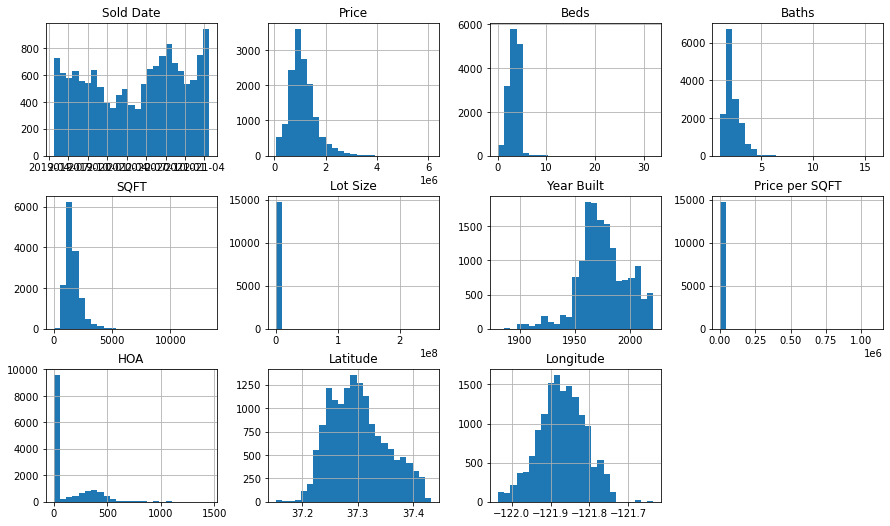

In [11]:
# now we'll explore distributions with nulls removed
ax_list = df.hist(bins=25, layout=(4,4), figsize=(15,12))

We can see that some variables are still heavily skewed by outliers so well pull updated summary statistics from the cleaned data

In [12]:
#check summary statistics
round(df.describe(), 3)

,Price,Beds,Baths,SQFT,Lot Size,Year Built,Price per SQFT,HOA,Latitude,Longitude
count,14744.000,14744.000,14744.000,14744.000,1.474400e+04,14744.000,14744.000,14744.000,14744.000,14744.000
mean,1105219.245,3.170,2.237,1641.174,3.254285e+04,1975.163,757.892,131.031,37.300,-121.871
std,519181.715,1.043,0.748,680.275,2.174486e+06,22.410,9056.076,209.378,0.051,0.060
min,60000.000,0.000,1.000,1.000,0.000000e+00,1880.000,61.489,0.000,37.152,-122.036
25%,772000.000,2.000,2.000,1203.000,1.431000e+03,1961.000,555.874,0.000,37.260,-121.909
50%,1020000.000,3.000,2.000,1502.000,5.806500e+03,1973.000,662.502,0.000,37.296,-121.870
75%,1355000.000,4.000,2.500,1912.250,6.884500e+03,1989.000,795.026,275.000,37.334,-121.829
max,6114253.000,32.000,16.000,13312.000,2.509927e+08,2021.000,1100000.000,1450.000,37.432,-121.635


Certain columns such as Price and SQFT, and particularly Lot Size and Price per SQFT, are heavily skewed by outliers by the fact that their mean values are noticeably higher than their medians.  We will make use of box plots to investigate this further.

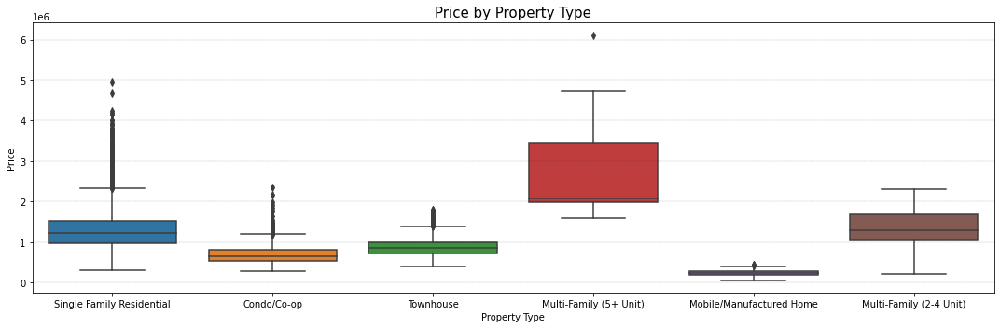

In [13]:
#check for outliers in price by property type
fig, ax = plt.subplots(1,1, figsize=(15,5))
sns.boxplot(x="Property Type", y="Price",data=df)
plt.grid(axis = 'y', color = 'black', linestyle = ':', linewidth = 0.25)
plt.title('Price by Property Type', fontsize = 15)
plt.tight_layout()
plt.show()

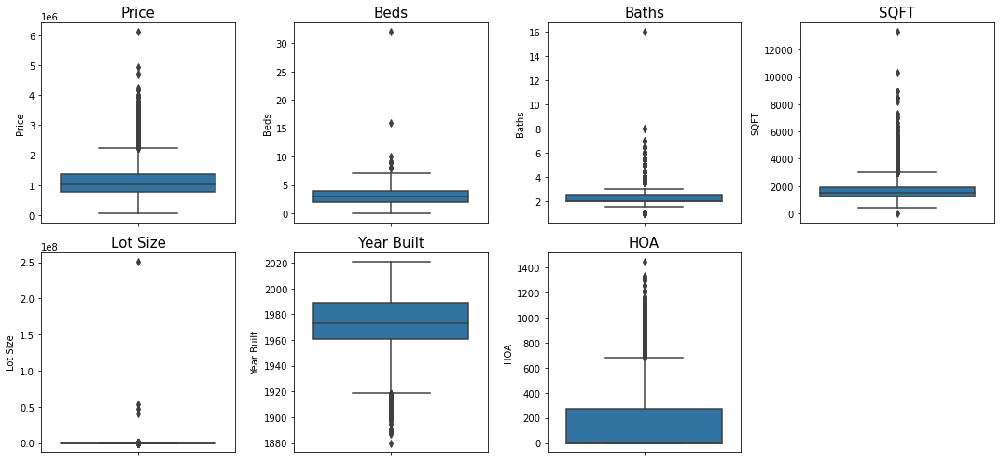

In [14]:
#use boxplots to see any significant outliers in rest of the data
plt.figure(figsize=(15,7))

plt.subplot(2,4,1)
sns.boxplot(y="Price", data=df)
plt.title("Price", fontsize=15)

plt.subplot(2,4,2)
sns.boxplot(y="Beds", data=df)
plt.title("Beds", fontsize=15)

plt.subplot(2,4,3)
sns.boxplot(y="Baths", data=df)
plt.title("Baths", fontsize=15)

plt.subplot(2,4,4)
sns.boxplot(y="SQFT", data=df)
plt.title("SQFT", fontsize=15)

plt.subplot(2,4,5)
sns.boxplot(y="Lot Size", data=df)
plt.title("Lot Size", fontsize=15)

plt.subplot(2,4,6)
sns.boxplot(y="Year Built", data=df)
plt.title("Year Built", fontsize=15)

plt.subplot(2,4,7)
sns.boxplot(y="HOA", data=df)
plt.title("HOA", fontsize=15)

plt.tight_layout()
plt.show()

As we will be eventually building a prediction model, I am most concerned with price, as extreme outliers in price can affect the accuracy of the model.  There is also major outliers in Lot Size that we should look at as well.

Since our housing data is not normally distributed, using the inter quartile range method to filter the data is beneficial since it uses the median as the measure of centrality, as opposed to the mean which can be heavily influenced by outliers.

In [15]:
#create function to filter outliers from data
def filt_iqr(df, column):
    median = df[column].median()
    q1 = df[column].quantile(q=0.05)
    q3 = df[column].quantile(q=0.95)
    
    # find a valid range, used 2*IQR instead of the standard 1.5*IQR because I do not want to filter out too much valid data
    iqr = [median-(2*q1), median+(2*q3)]
    print("Column: {}, Median:{}, 05%:{}, 95%:{}, IQR:{}:{}".format(column, median, q1, q3, iqr[0].round(2), iqr[1].round(2)))
    
    # filter (I only want to filter out the high outliers, low outliers are ok)
    df_to_keep = df[(df[column] < iqr[1])] 
    
    #print
    num_rows_dropped = df.shape[0] - df_to_keep.shape[0]
    print("Number of rows dropped: " + str(num_rows_dropped))
    
    return df_to_keep

In [16]:
#filter data first on price, then on lot size columns
temp_iqr = filt_iqr(df, 'Price')
temp2_iqr = filt_iqr(temp_iqr, 'Lot Size')

# Looking at the summary statistics above and histograms, there is a major outlier in Price per SQFT.  The MAX Price per SQFT
# is 1,100,000 but the MAX Price was 6,114,253. This means at most the square footage of this row can be is ~6 sqft.
# This is obviously bad data and should be filtered out
temp3_iqr = filt_iqr(temp2_iqr, 'Price per SQFT')

Column: Price, Median:1020000.0, 05%:428000.0, 95%:2077549.9999999956, IQR:164000.0:5175100.0
Number of rows dropped: 1
Column: Lot Size, Median:5806.0, 05%:0.0, 95%:11038.899999999996, IQR:5806.0:27883.8
Number of rows dropped: 133
Column: Price per SQFT, Median:662.7101530947684, 05%:383.77494456762753, 95%:1054.2355340912495, IQR:-104.84:2771.18
Number of rows dropped: 1


(14609, 13)

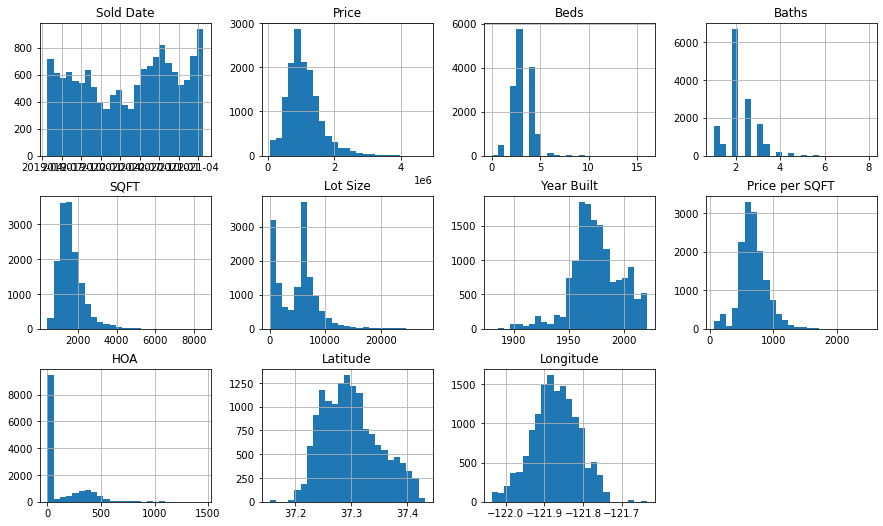

In [17]:
#check distributions now that outliers in price are filtered out
ax_list = temp3_iqr.hist(bins=25, layout=(4,4), figsize=(15,12))
temp3_iqr.shape

- By filtering the most extreme outliers in Price and Lot Size, the Beds and Baths variables in turn became less skewed as well.
- Looking at the sold date variable, since the data spans 2 years and there are 25 bins each bar roughly corresponds to one month. We can see that the count of sales were on a downward trend until the middle of the dataset and then has been gradually increasing ever since. This roughly correlates with April/May 2020. 

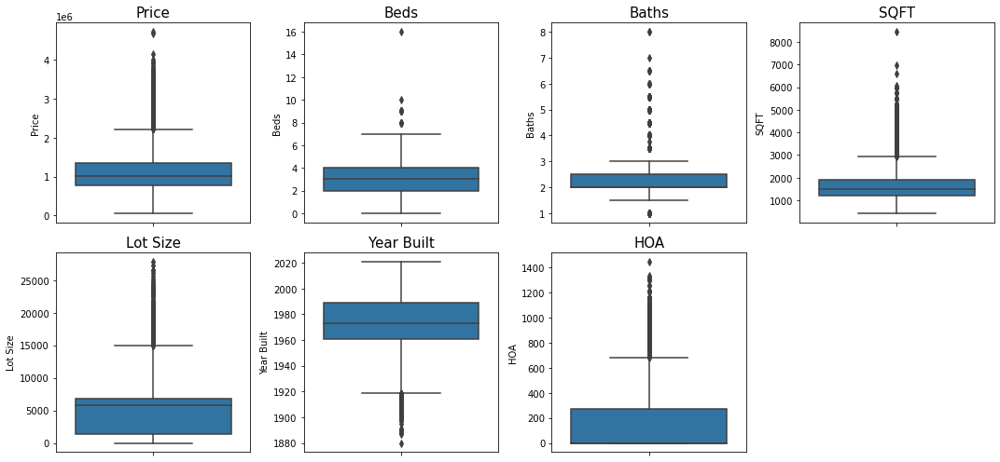

In [18]:
#once again use boxplots to see what data looks like with extreme outliers removed
plt.figure(figsize=(15,7))

plt.subplot(2,4,1)
sns.boxplot(y="Price", data=temp3_iqr)
plt.title("Price", fontsize=15)

plt.subplot(2,4,2)
sns.boxplot(y="Beds", data=temp3_iqr)
plt.title("Beds", fontsize=15)

plt.subplot(2,4,3)
sns.boxplot(y="Baths", data=temp3_iqr)
plt.title("Baths", fontsize=15)

plt.subplot(2,4,4)
sns.boxplot(y="SQFT", data=temp3_iqr)
plt.title("SQFT", fontsize=15)

plt.subplot(2,4,5)
sns.boxplot(y="Lot Size", data=temp3_iqr)
plt.title("Lot Size", fontsize=15)

plt.subplot(2,4,6)
sns.boxplot(y="Year Built", data=temp3_iqr)
plt.title("Year Built", fontsize=15)

plt.subplot(2,4,7)
sns.boxplot(y="HOA", data=temp3_iqr)
plt.title("HOA", fontsize=15)

plt.tight_layout()

In [19]:
#assign filtered dataframe to new dataframe
homesales = temp3_iqr

### Exploratory Analysis

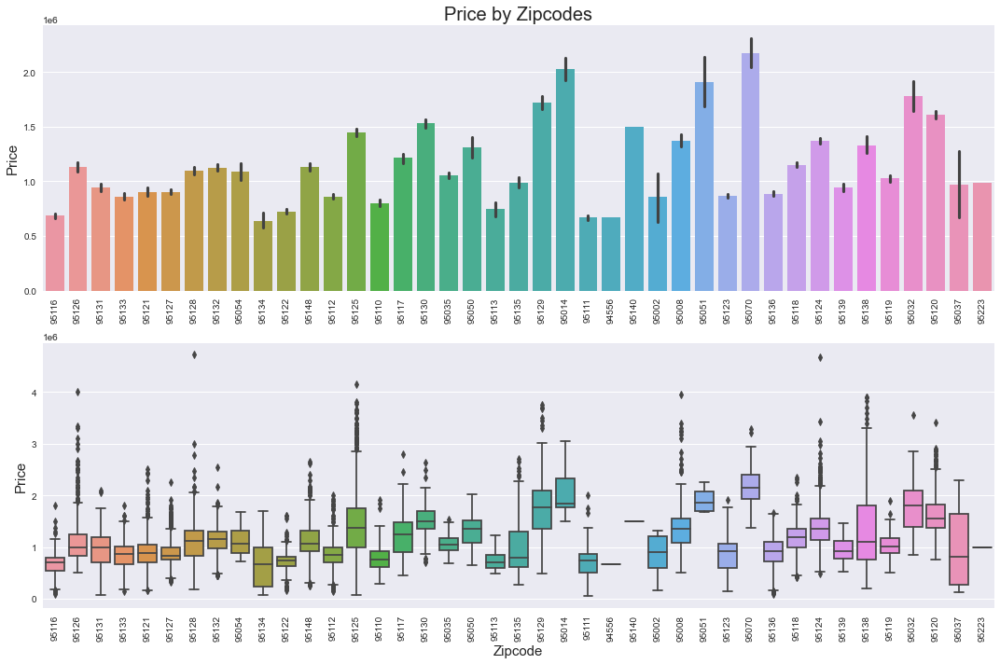

In [20]:
#use barplot and boxplots to get an idea of the price across zipcodes
plt.figure(figsize=(15,10))
plt.style.use("seaborn")

plt.subplot(2,1,1)
sns.barplot(x="Zipcode", y="Price", data=homesales)
plt.title("Price by Zipcodes", fontsize=20)
plt.xlabel(None)
plt.ylabel("Price", fontsize=15)
plt.xticks(rotation=90) 

plt.subplot(2,1,2)
sns.boxplot(x="Zipcode", y="Price", data=homesales)
plt.xlabel("Zipcode", fontsize=15)
plt.ylabel("Price", fontsize=15)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

- Looking at the barplot, the most expensive zipcodes by average price are 95070 and 95014
- When analyzing the boxplot however, we can see the two most expensive properties are in zipcodes 95128 and 95124, which are in the middle of the pack in terms of mean property prices

**Overlaying data on street maps:** 
- We will use the **tilemapbase** python package to make use of our latitude and longitude coordinates to see where these zipcodes are located

In [21]:
# import package for mapping visualizations with geographic data
import tilemapbase
tilemapbase.start_logging()
tilemapbase.init(create=True)

#Use open street map
t = tilemapbase.tiles.build_OSM()

# get middle lat and long coordinates of dataset
mid_lon = homesales['Longitude'].mean()
mid_lat = homesales['Latitude'].mean()

#use middle lat and long for the city center
city_center = (mid_lon, mid_lat)

#create the extent of the map
degree_range = 0.175
extent = tilemapbase.Extent.from_lonlat(city_center[0] - degree_range, city_center[0] + degree_range,
                                       city_center[1] - degree_range, city_center[1] + degree_range)
extent = extent.to_aspect(1.0)

#path to plot
longs = homesales['Longitude']
lats = homesales['Latitude']

#convert to mercator
path = [tilemapbase.project(x,y) for x,y in zip(longs, lats)]
x, y = zip(*path)

#create plotter
plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=1000)

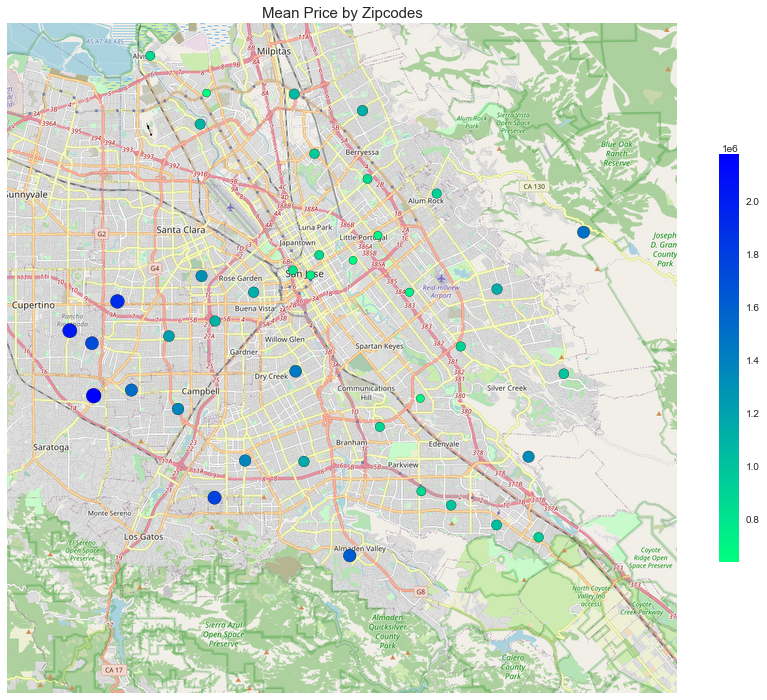

In [22]:
#filter df to group by zipcode and take the average price by zipcode
zip_mean = homesales.groupby(['Zipcode'])[['Price','Longitude','Latitude']].mean()
#convert to mercator
path2 = [tilemapbase.project(x2,y2) for x2,y2 in zip(zip_mean['Longitude'], zip_mean['Latitude'])]
x2, y2 = zip(*path2)


# plot
fig, ax = plt.subplots(figsize=(15,15))
plotter.plot(ax)

cm = plt.cm.get_cmap('winter_r')
sc = ax.scatter(x2, y2, s=zip_mean['Price']/10000, c=zip_mean['Price'], edgecolors='black', cmap=cm)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_title('Mean Price by Zipcodes', fontsize=15)
plt.colorbar(sc, shrink=.5)
plt.show()

- Here we look at the average price per zipcode. We see that the more affordable zipcodes are located around downtown and eastern city neighborhoods
- The most exclusive neighborhoods are clustered in the Southwest portion of San Jose, particularly near the Cupertino and Saratoga borders

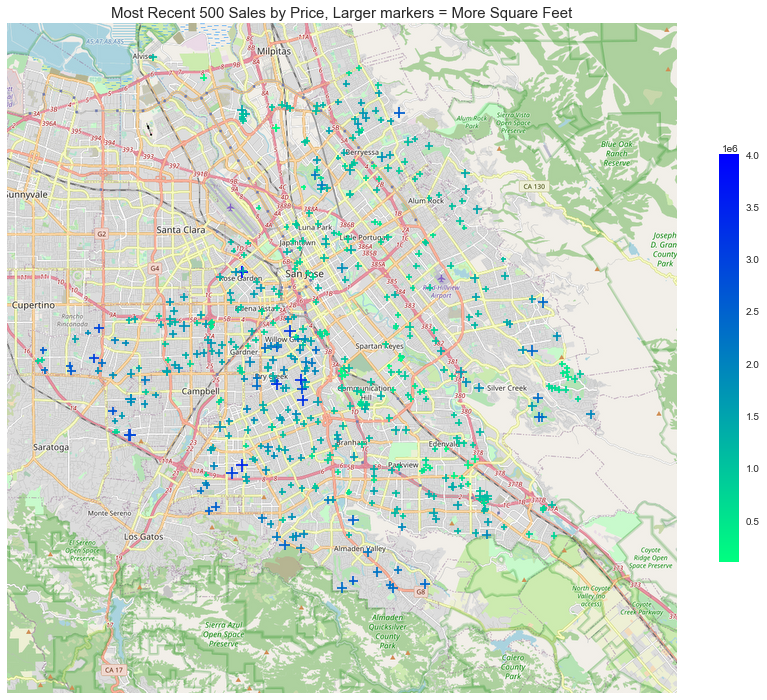

In [23]:
#filter for the most recent 500 home sales
last500 = homesales.sort_values(by='Sold Date', ascending=False)
last500 = last500.head(500)

#convert to mercator
path3 = [tilemapbase.project(x3,y3) for x3,y3 in zip(last500['Longitude'], last500['Latitude'])]
x3, y3 = zip(*path3)

# plot
fig, ax = plt.subplots(figsize=(15,15))
plotter.plot(ax)

sc = ax.scatter(x3, y3, s=last500['SQFT']/30, c=last500['Price'], cmap=cm, marker='+')
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
ax.set_title('Most Recent 500 Sales by Price, Larger markers = More Square Feet', fontsize=15)
plt.colorbar(sc, shrink=.5)
plt.show()

- Looking at the most recent 500 home sales, the pricing reflects a similar pattern as we saw when looking at average price by zipcode.
- Here we see the Willow Glen neighborhood in the center of the map just south of downtown is the hottest market right now with the most noticeable cluster of sales. They are higher priced and also have larger floorplans.
- We also see the closer you get to downtown, as well as in eastern parts of the city until you approach city boundaries, the floorplans are smaller.

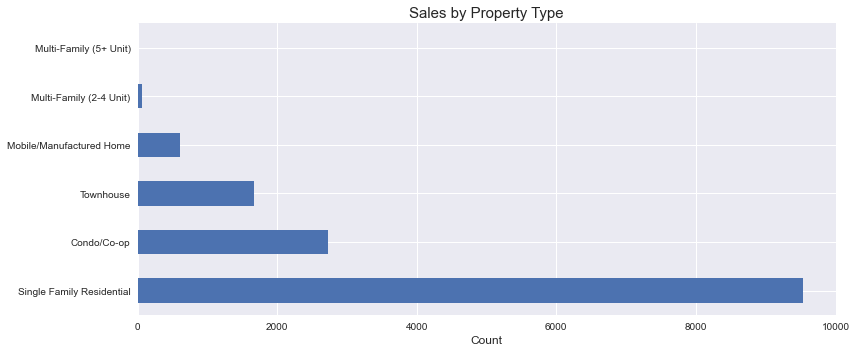

In [24]:
fig, ax = plt.subplots(figsize=(12,5))

homesales['Property Type'].value_counts().plot(kind='barh', ax=ax)
ax.set_xlabel('Count', fontsize=12)
ax.set_title('Sales by Property Type', fontsize=15)
ax.tick_params(labelrotation=0)
plt.tight_layout()

- Single Family Residential are by far the most popular property type, followed by condos.

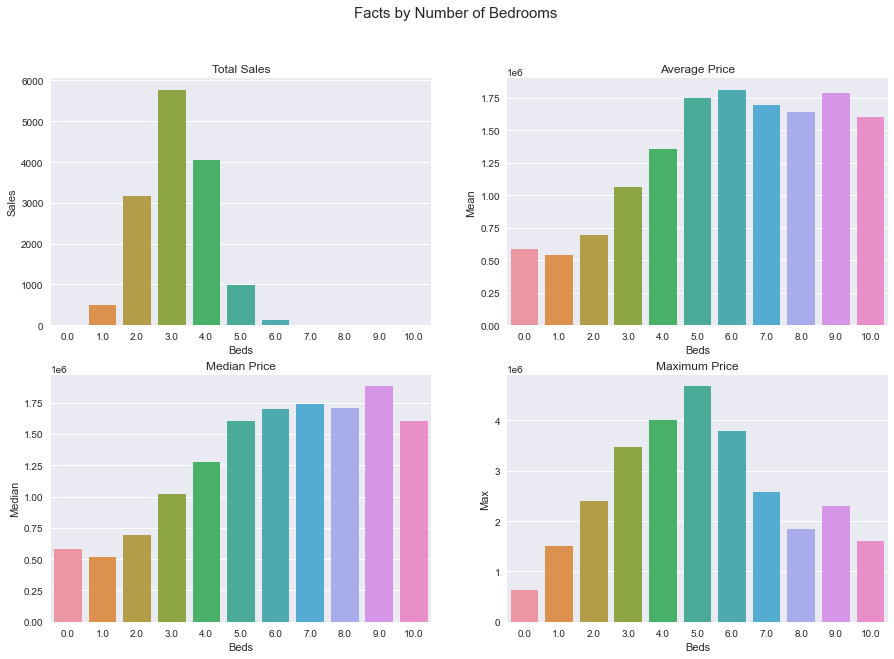

In [25]:
#create summary statistics grouped by number of bedrooms
count = homesales.groupby('Beds')['Price'].count()
mean_price = homesales.groupby('Beds')['Price'].mean()
med_price = homesales.groupby('Beds')['Price'].median()
max_price = homesales.groupby('Beds')['Price'].max()

#merge statistics into a new dataframe and reset index for plotting
df_beds = pd.DataFrame({"Sales":count, "Mean":mean_price, "Median":med_price, "Max":max_price})
df_beds = df_beds.reset_index()

#drop rows with a high bedroom count for plots that are not stretched
beds_filt = df_beds.drop(df_beds[df_beds["Beds"]>12].index)

#create figure and axes to plot
fig, [[ax1, ax2],[ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(15,10))
fig.suptitle('Facts by Number of Bedrooms', fontsize=15)

sns.barplot(ax=ax1, x='Beds', y='Sales', data=beds_filt)
ax1.set_title('Total Sales')
sns.barplot(ax=ax2, x='Beds', y='Mean', data=beds_filt)
ax2.set_title('Average Price')
sns.barplot(ax=ax3, x='Beds', y='Median', data=beds_filt)
ax3.set_title('Median Price')
sns.barplot(ax=ax4, x='Beds', y='Max', data=beds_filt)
ax4.set_title('Maximum Price')

plt.show()

- 3 and 4 bedroom homes are the most sought for layouts for homes.
- Homes with 5+ bedrooms command the highest average selling price, although they are not sold in high quantities.
- Interestingly the most expensive homes sold were 4 and 5 bedroom layouts, the maximum selling price gradually drops once bedrooms increase after this point.

In [26]:
#print dataframe used above so we can see the statistics
df_beds

,Beds,Sales,Mean,Median,Max
0,0.0,8,5.870625e+05,583750.0,640000.0
1,1.0,498,5.380345e+05,515000.0,1500000.0
2,2.0,3164,6.947787e+05,695000.0,2400000.0
3,3.0,5766,1.059473e+06,1020000.0,3480000.0
4,4.0,4038,1.353251e+06,1275000.0,4000000.0
5,5.0,977,1.745891e+06,1600000.0,4675125.0
6,6.0,119,1.808825e+06,1700000.0,3800000.0
7,7.0,17,1.692471e+06,1740000.0,2575000.0
8,8.0,8,1.641609e+06,1704000.0,1850000.0
9,9.0,12,1.786948e+06,1878250.0,2300000.0


I want to focus more into the geographic distribution of price, year built, square footage, and lot size since I believe these can weigh heavily on a home's selling price.

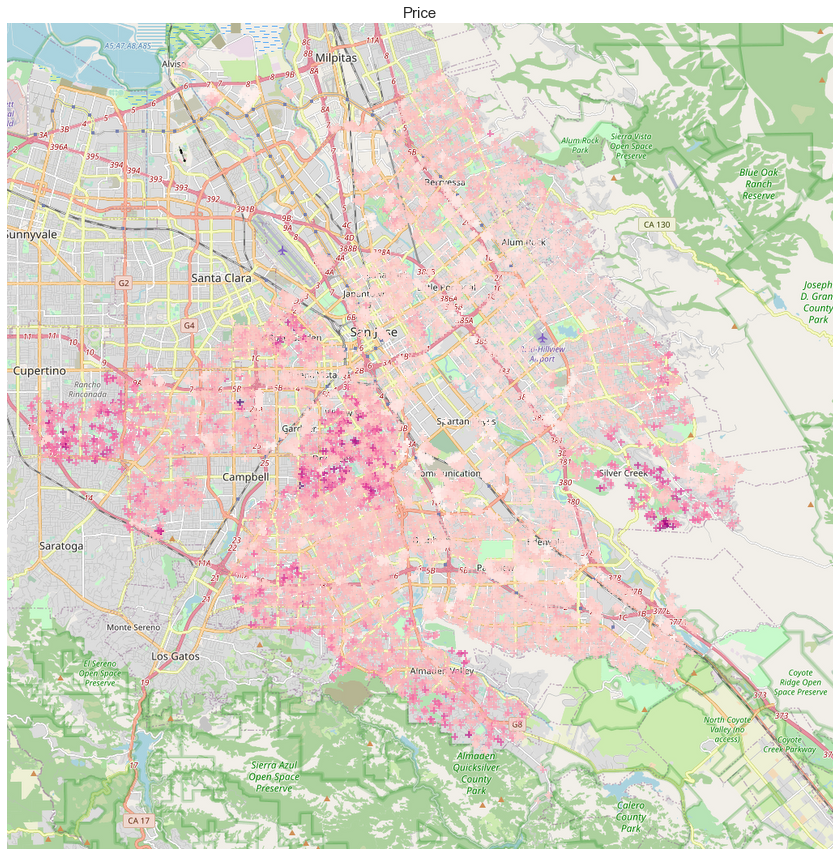

In [27]:
#plot price map
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize=(12,12))

ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
plotter.plot(ax1)
ax1.scatter(x, y, c = homesales['Price'], cmap='RdPu', marker='+', alpha=.7)
plt.title('Price', fontsize=15)
plt.tight_layout()
plt.show()

- Something I did not notice before is there is a cluster of higher priced homes in the southeast corner of the city. According to the map this equates witht the Silver Creek neighborhood and is a significant cluster that is detached from the western parts of the city that command high prices.

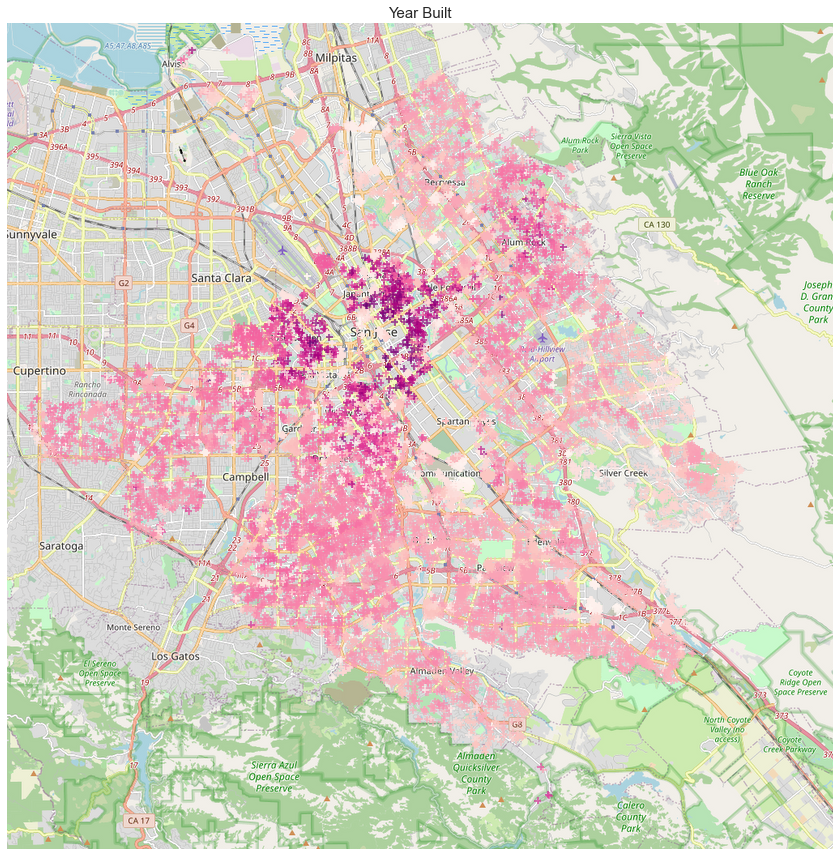

In [28]:
#plot year built map
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,12))

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter.plot(ax)
ax.scatter(x, y, c = homesales['Year Built'], cmap='RdPu_r', marker='+', alpha=.7)
plt.title('Year Built', fontsize=15)
plt.tight_layout()
plt.show()

- Using a reversed colorscale, we see that older homes that are selling are centered around the downtown area, which makes sense.
- The Silver Creek neighborhood that we discovered to have higher priced homes seemed to consist of maily newer builds.

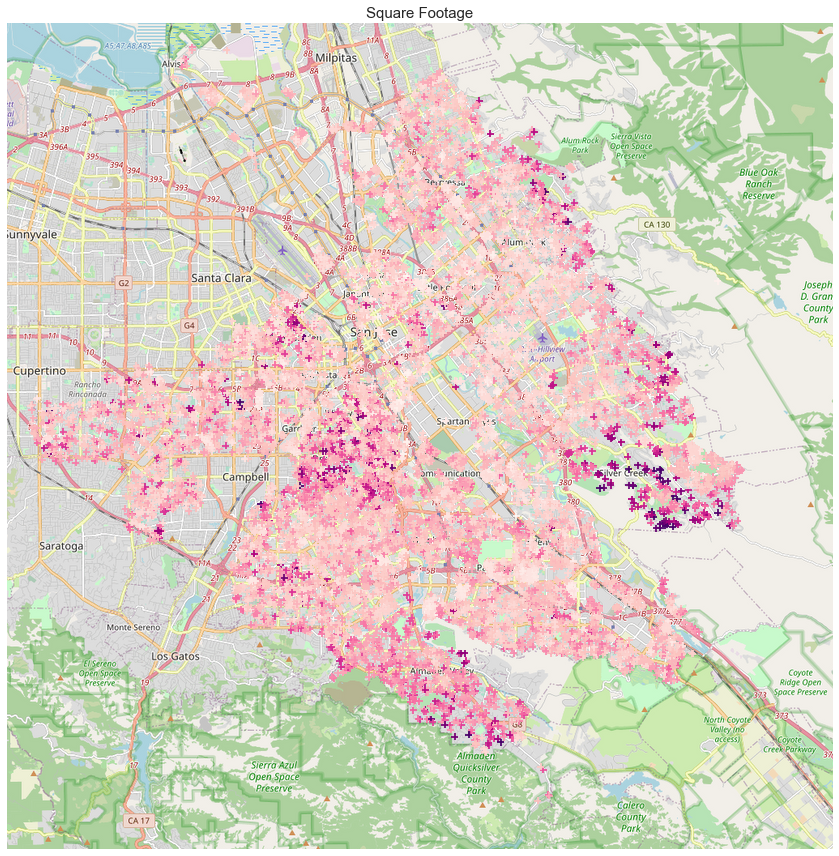

In [29]:
#plot square footage map
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,12))

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter.plot(ax)
ax.scatter(x, y, c = homesales['SQFT'], vmax=5000, cmap='RdPu', marker='+')
plt.title('Square Footage', fontsize=15)
plt.tight_layout()
plt.show()

- We see that generally, the further you get from city center, the larger the floorplans.
- The area near the center of the map West of Campbell is an exception and has larger than average floorplans as well.
- The new homes in the Silver Creek neighborhood appear to have large layouts as well.

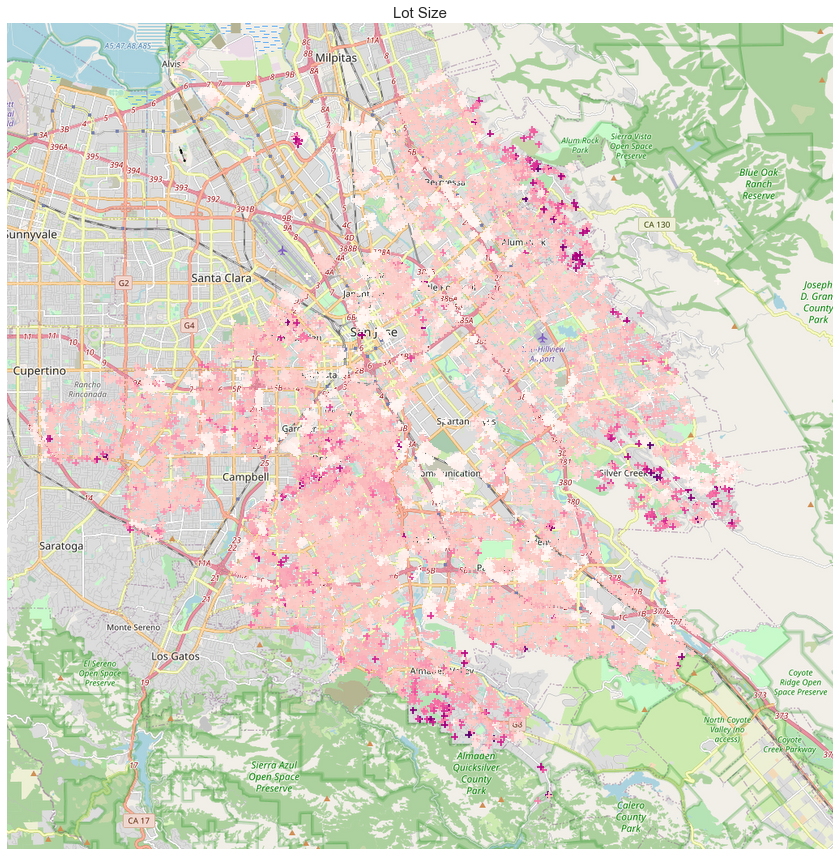

In [30]:
#plot lot size map
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,12))

ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
plotter.plot(ax)
ax.scatter(x, y, c = homesales['Lot Size'], cmap='RdPu', marker='+')
plt.title('Lot Size', fontsize=15)
plt.tight_layout()
plt.show()

- It makes sense that properties with larger lots are around the perimeter of the city.

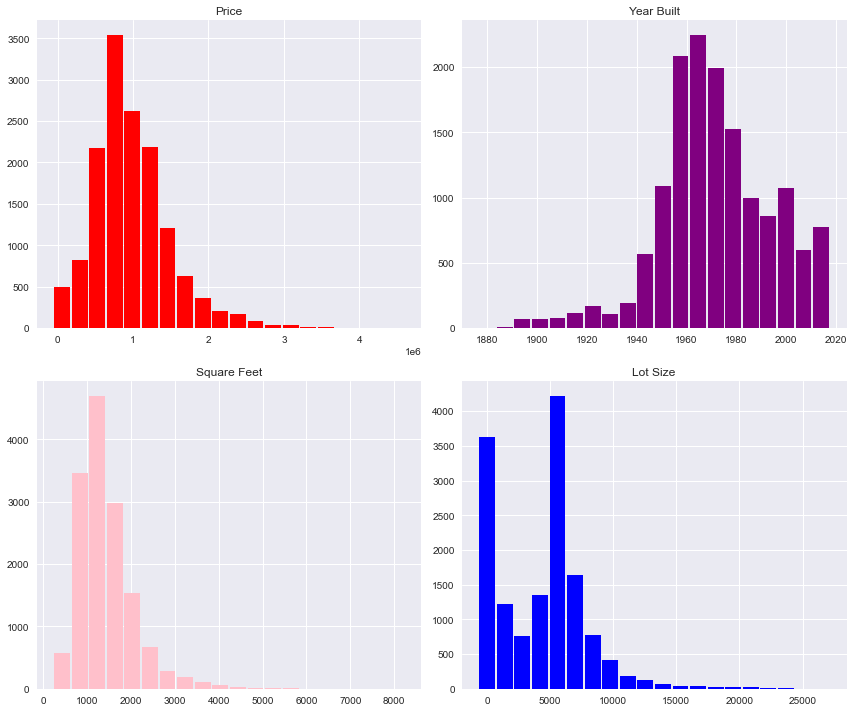

In [31]:
fig, [[ax1, ax2],[ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(12,10))

#plot hist by price
ax1.hist(homesales['Price'], bins=20, color='red', rwidth=.9, align='left')
ax1.set_title('Price')

#plot hist by year built
ax2.hist(homesales['Year Built'], bins=20, color='purple', rwidth=.9, align='left')
ax2.set_title('Year Built')

#plot hist by sqft
ax3.hist(homesales['SQFT'], bins=20, color='pink', rwidth=.9, align='left')
ax3.set_title('Square Feet')

#plot hist by lot size
ax4.hist(homesales['Lot Size'], bins=20, color='blue', rwidth=.9, align='left')
ax4.set_title('Lot Size')

plt.tight_layout()
plt.show()

- In the charts above we see that the most desirable area is the southwest part of the city since these have higher sale prices.  The majority of home sell between 800,000-1.25 million dollars.
- The oldest home that are selling are clustered around the downtown area.  The majority of homes that are being sold were built between the 1950s and 1980s.
- In terms of square footage, the higher square footage homes and lot sizes are around the perimeter of the city, while the closer to the city center you get, the smaller the square footage.  The majority of homes being sold are <2500 square feet.
- The most common lot size is around 5500 sqft.  There is also high number of properties with 0 sqft. for lot size, this makes sense for condo/townhomes that sometimes will not have a lot.

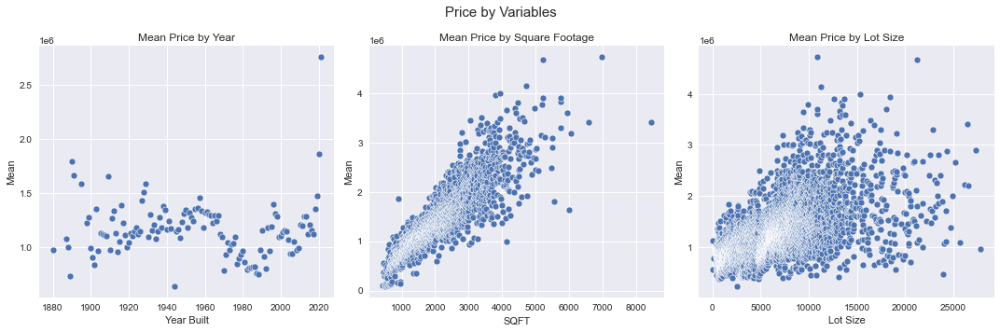

In [32]:
#create mean price statistic grouped by fields we studied above
mean_year = homesales.groupby('Year Built')['Price'].mean()
mean_sqft = homesales.groupby('SQFT')['Price'].mean()
mean_lot = homesales.groupby('Lot Size')['Price'].mean()

#put grouped by fields into new dataframes and reset indexes for plotting
df_year = pd.DataFrame({"Mean":mean_year})
df_year = df_year.reset_index()
df_sqft = pd.DataFrame({"Mean":mean_sqft})
df_sqft = df_sqft.reset_index()
df_lot = pd.DataFrame({"Mean":mean_lot})
df_lot = df_lot.reset_index()

#plot scatterplots to see if there is a relationship
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,5))
fig.suptitle('Price by Variables', fontsize=15)

plt.subplot(1,3,1)
sns.scatterplot(x='Year Built', y='Mean', data=df_year)
plt.title('Mean Price by Year')
plt.subplot(1,3,2)
sns.scatterplot(x='SQFT', y='Mean', data=df_sqft)
plt.title('Mean Price by Square Footage')
plt.subplot(1,3,3)
sns.scatterplot(x='Lot Size', y='Mean', data=df_lot)
plt.title('Mean Price by Lot Size')

plt.tight_layout()
plt.show()

- It appears that the year built does not have much of an influence on the price of a property. There is a positive relationship between price and the sqft and lot size variables with sqft being the most apparent.
- Below we will look at these correlations further.

### Correlations

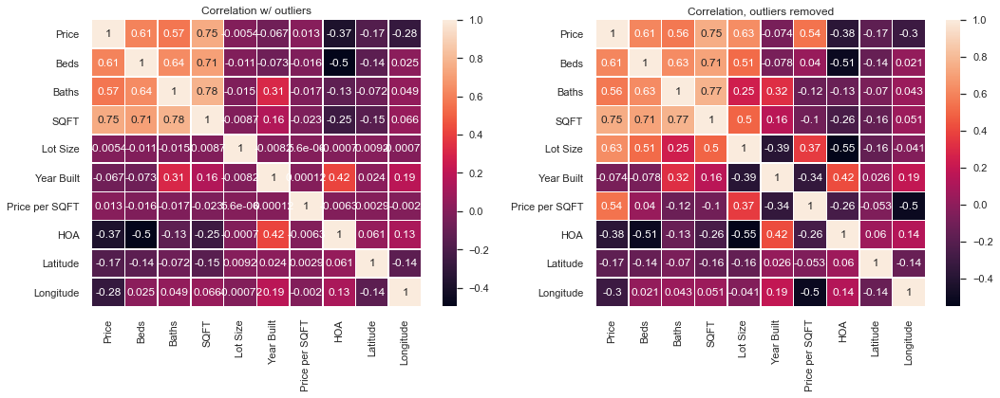

In [33]:
#here i am plotting heatmaps to determine the the strength of the correlations between variables. I do this with the 
#dataframe with outliers still included, as well as with outliers removed to see if the removal of outliers had an 
#effect on the relationships

corr_df = df.corr()
corr_home = homesales.corr()

plt.figure(figsize=(15,6))
sns.set(font_scale=1.0)

plt.subplot(1,2,1)
sns.heatmap(corr_df, annot=True, linewidth=0.5)
plt.title('Correlation w/ outliers')

plt.subplot(1,2,2)
sns.heatmap(corr_home, annot=True, linewidth=0.5)
plt.title('Correlation, outliers removed')

plt.tight_layout()
plt.show()

- As expected, the removal of outliers had a drastic effect on the Lot Size variable.  The correlation of Lot Size and Price improved from 0.005 to 0.63.

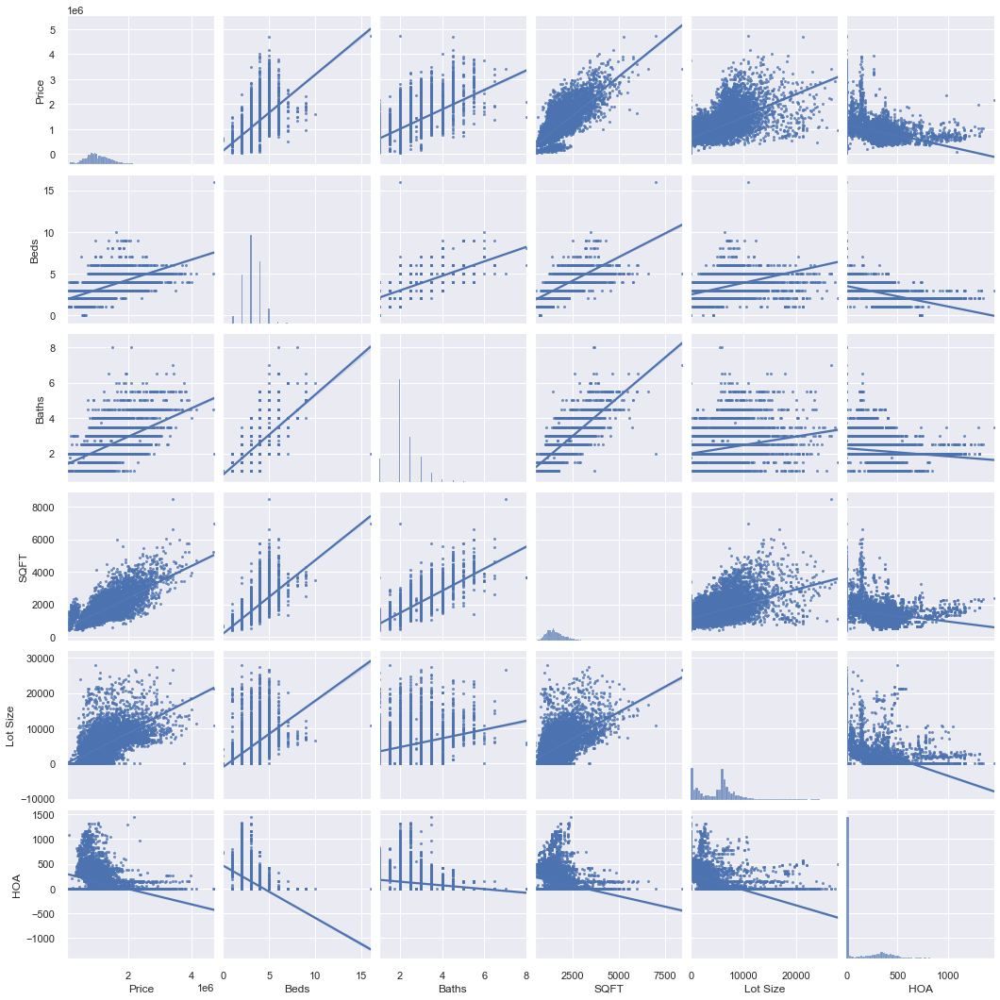

In [34]:
#beds, baths, sq ft, and lot size have strong positive correlations on price.  HOA has the stongest negative correlation 
#with -0.38. I will use pairplot with a regression line to confirm the trends on these variables.

col = ['Price', 'Beds', 'Baths', 'SQFT', 'Lot Size', 'HOA']

sns.pairplot(homesales[col], kind="reg", markers=".")
plt.show()

- We see our analysis is confirmed.  These variables will be used to create our linear regression model.  

#### Dummy Variables: 

I wanted to make sure we factor in the property type in our model as well. A single family home is definitely valued more than say a condo or mobile home of similar stats.  Therefore we will make use of dummy variables below in order to take this into account.

In [35]:
#create dummy variables and add to dataframe
dummy = pd.get_dummies(homesales['Property Type'], drop_first=True)
data = pd.concat([homesales, dummy], axis=1)
homesales = data
homesales.head()

,Sold Date,Property Type,Zipcode,Price,Beds,Baths,SQFT,Lot Size,Year Built,Price per SQFT,HOA,Latitude,Longitude,Mobile/Manufactured Home,Multi-Family (2-4 Unit),Multi-Family (5+ Unit),Single Family Residential,Townhouse
0,2019-05-24,Single Family Residential,95116,808000.0,4.0,2.0,1263.0,5012.0,1960.0,639.746635,0.0,37.344478,-121.842584,0,0,0,1,0
1,2020-03-23,Condo/Co-op,95126,623000.0,1.0,1.0,808.0,0.0,1985.0,771.039604,290.0,37.308910,-121.918937,0,0,0,0,0
2,2021-03-11,Condo/Co-op,95131,820000.0,2.0,2.0,1389.0,1224.0,1997.0,590.352772,478.0,37.386910,-121.887934,0,0,0,0,0
3,2019-07-12,Condo/Co-op,95133,527500.0,2.0,2.0,832.0,1039.0,1981.0,634.014423,440.0,37.383578,-121.859213,0,0,0,0,0
4,2019-10-30,Single Family Residential,95121,875000.0,5.0,3.0,1676.0,6528.0,1979.0,522.076372,0.0,37.307749,-121.817538,0,0,0,1,0


### OLS Regression

To reiterate from above, there are strong positive correlations between Price and the variables Beds, Baths, Sq Ft, and Lot Size.  The strongest negative correlation I found was with HOA.

I am going to use **statsmodels.api** to run a multiple linear regression model with these variables, along with the dummy variables, to predict the values of properties. With this model, CG Realty can then identify which properties would make viable investments.

In [36]:
#import statsmodels
import statsmodels.api as sm

In [37]:
#first we include all numerical categories(minus days on market)
x = homesales[['Beds', 'Baths', 'SQFT', 'Lot Size', 'HOA', 
               'Mobile/Manufactured Home', 'Multi-Family (2-4 Unit)', 
               'Multi-Family (5+ Unit)', 'Single Family Residential', 'Townhouse']]
y = homesales['Price']
x = sm.add_constant(x)


#create model
model = sm.OLS(y, x).fit()

prediction = model.predict(x)

print(">>>All variables:<<<")
print(model.summary())
print()

>>>All variables:<<<
                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.720
Model:                            OLS   Adj. R-squared:                  0.720
Method:                 Least Squares   F-statistic:                     3758.
Date:                Fri, 21 May 2021   Prob (F-statistic):               0.00
Time:                        14:11:28   Log-Likelihood:            -2.0337e+05
No. Observations:               14609   AIC:                         4.068e+05
Df Residuals:                   14598   BIC:                         4.068e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
c

- The model has an r-square of .72 and low p-values across the variables.  It can do a decent job of predicting property values.
- The coefficient for Beds in our model is -50880, which means for every additional bedroom, 50,000 dollars is knocked off the value of the home.  This might be because for every bedroom added, it takes away common living area space from the house.


In [38]:
#save to csv the predictions, actual prices, and the cleaned dataset homesales
prediction = pd.DataFrame(prediction, columns=['Prediction'])
price = pd.DataFrame(y, columns=['Price'])

#reset the indexes
prediction = prediction.reset_index()
price = price.reset_index()
homesales = homesales.reset_index()

#save to csv's
homesales.to_csv(root / 'homesales_clean.csv')

In [39]:
#create a test input to see if model runs.

test_input = pd.DataFrame({'const':[1.0], 'Beds':[4.0], 'Baths':[2.0], 'SQFT':[1399.0], 'Lot Size':[5500.0], 
                           'HOA':[0.0], 'Mobile/Manufactured Home':[0], 'Multi-Family (2-4 Unit)':[0], 
                           'Multi-Family (5+ Unit)':[0], 'Single Family Residential':[1], 'Townhouse':[0]})

prediction1 = model.predict(test_input)
print(prediction1)

0    1.057955e+06
dtype: float64


- The model predicts that this home is valued at $1,057,955$ dollars. These were real stats for a house in San Jose that sold for $1,065,000$ dollars, so for this example this would not have been a viable property for CG Realty to invest in since it was overvalued in the selling price.

#### Additional Insights

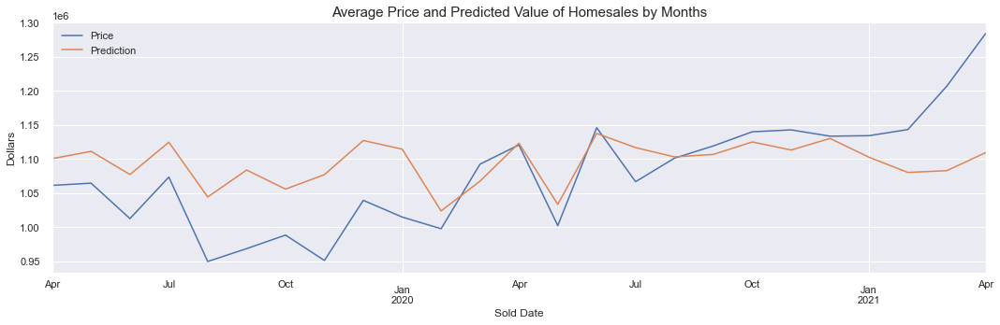

In [40]:
#merge predicted values to homesales df
combo_df = pd.concat([homesales, prediction], axis=1)

#group by monthly mean price
daily_p = combo_df.set_index('Sold Date').groupby(pd.Grouper(freq='D'))['Price'].mean()
monthly_p = daily_p.groupby(pd.Grouper(freq='M')).mean()

#group by monthly mean predicted value
daily_v = combo_df.set_index('Sold Date').groupby(pd.Grouper(freq='D'))['Prediction'].mean()
monthly_v = daily_v.groupby(pd.Grouper(freq='M')).mean()

#plot
fig, ax = plt.subplots(figsize=(15,5))

ax = monthly_p.plot(kind='line')
ax = monthly_v.plot(kind='line')
ax.legend()
ax.set_title("Average Price and Predicted Value of Homesales by Months", fontsize=15)
ax.set_ylabel('Dollars')
plt.tight_layout()
plt.show()

- Looking at the market trends, in the year preceding the pandemic properties were selling for below their value and had good ROI value. Since April 2020 however, the selling price of properties has increased while values have remained stagnant.  This means it will be harder to find properties that will be viable investments as it is a seller's market.

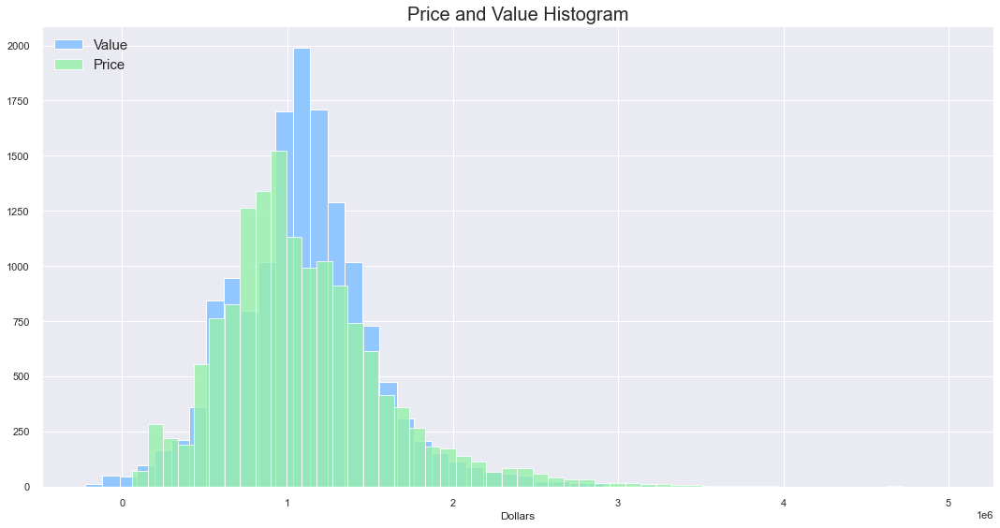

In [41]:
#create hist of price and value
plt.figure(figsize=(15,8))
plt.style.use('seaborn-pastel')
plt.hist(combo_df['Prediction'], bins=50, label = 'Value',)
plt.hist(combo_df['Price'], bins=50, alpha=0.8, label = 'Price')
plt.legend(loc='upper left', fontsize=15)
plt.title('Price and Value Histogram', fontsize=20)
plt.xlabel('Dollars')
plt.tight_layout()
plt.show()

- According to our model, it looks like properties that sell for under 1 million dollars are generally not great investments because they are selling above their value.  This could be because homes at this pricepoint are more affordable for the average buyer in San Jose, and therefore have increase competition and bidding wars that can drive up the price above the true value of the property.  Once you cross the 1 million dollar threshold, homes are selling for below their true value, which could make for good investments for CG Realty. Once you near 1.75 million for prices, the trend is once again that houses are overvalued.